# Depth Anything V2 (ViT-L) — uji kelayakan pada foto intraoral frontal

Notebook ini **bukan** pipeline produksi. Ini **uji kelayakan (feasibility probe)**: satu-satunya
pertanyaan yang dijawab di sini adalah —

> *Apakah peta kedalaman Depth Anything V2 pada foto intraoral kita membawa informasi geometri gigi
> yang nyata, atau cuma mengulang informasi kecerahan (shading/flash) yang sudah ada di RGB?*

Kalau jawabannya "cuma mengulang kecerahan", maka tidak ada gunanya melanjutkan ke RGB-D 4-channel
atau fitur depth apa pun — dan kita berhenti di sini. Notebook ini dirancang untuk **membunuh ide
itu secepat mungkin** kalau memang harus mati.

Jalankan **top-to-bottom (Run All)**. Dataset: `Front Teeth drg Laura/` (18 foto klinis).

---

### Yang perlu diingat sebelum melihat hasilnya

- Output Depth Anything adalah **relative inverse depth** — nilai besar = lebih dekat ke kamera.
  Skala & offset **tidak diketahui** dan **berbeda tiap gambar**. Jadi nilai piksel di foto A
  tidak sebanding dengan foto B. Semua analisis di bawah karenanya bersifat **intra-gambar**.
- Model dilatih pada foto natural (jalan, ruangan, orang). Foto makro rongga mulut ada
  **di luar distribusi latihnya**. Kegagalan di sini normal dan informatif.

## 0. Instalasi

```bash
pip install -r requirements.txt      # sudah mencakup torch, transformers, pillow-heif
pip install transformers>=4.45       # Depth Anything V2 butuh transformers cukup baru
```

Bobot `depth-anything/Depth-Anything-V2-Large-hf` **tidak gated** — tidak perlu login HuggingFace.
Ukuran ~1.3 GB, terunduh sekali saja lalu di-cache.

Jalan di Mac Apple Silicon (MPS). Catatan: beberapa build PyTorch punya bug MPS pada operasi
interpolasi model ini — kalau hasilnya aneh/NaN, set `"force_cpu": True` di CONFIG.

In [1]:
# ========= CONFIG =========
CONFIG = {
    # --- model ---
    "model_id":    "depth-anything/Depth-Anything-V2-Large-hf",   # Small-hf / Base-hf / Large-hf
    "force_cpu":   False,      # True kalau MPS bermasalah (lebih lambat tapi aman)

    # --- data ---
    "img_dir":     "Front Teeth drg Laura",
    "out_dir":     "depth_out",          # hasil PNG + npy disimpan di sini
    "save_npy":    True,                 # simpan depth mentah (float32) untuk analisis lanjutan

    # --- ROI gigi: IDENTIK dengan pipeline DINOv2/DINOv3 supaya sebanding ---
    "use_roi":     True,       # False = inferensi pada foto penuh
    "roi_s_thr":   0.30,
    "roi_v_thr":   0.55,
    "roi_pad":     0.10,

    # --- probe ---
    "spec_thr":    0.92,       # piksel dengan V > ini dianggap spekular (pantulan flash/saliva)
    "profile_frac": 0.50,      # posisi vertikal garis pindai horizontal (0=atas, 1=bawah ROI)
}
print("CONFIG:", CONFIG)

CONFIG: {'model_id': 'depth-anything/Depth-Anything-V2-Large-hf', 'force_cpu': False, 'img_dir': 'Front Teeth drg Laura', 'out_dir': 'depth_out', 'save_npy': True, 'use_roi': True, 'roi_s_thr': 0.3, 'roi_v_thr': 0.55, 'roi_pad': 0.1, 'spec_thr': 0.92, 'profile_frac': 0.5}


## 1. Import, device, dan daftar file

In [2]:
import os, glob, json, warnings
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image

warnings.filterwarnings("ignore", category=UserWarning)

# --- dukungan .heic (foto iPhone di set drg Laura) ---
try:
    from pillow_heif import register_heif_opener
    register_heif_opener()
    HEIC_OK = True
except Exception as e:
    HEIC_OK = False
    print("pillow-heif tidak tersedia -> file .heic akan dilewati.", e)

def pick_device():
    if CONFIG["force_cpu"]:                 return torch.device("cpu")
    if torch.backends.mps.is_available():   return torch.device("mps")
    if torch.cuda.is_available():           return torch.device("cuda")
    return torch.device("cpu")

DEVICE = pick_device()
print("Device:", DEVICE, "| torch", torch.__version__)

EXTS = ("*.jpg", "*.jpeg", "*.JPG", "*.JPEG", "*.png", "*.PNG", "*.heic", "*.HEIC")
paths = []
for e in EXTS:
    paths += glob.glob(os.path.join(CONFIG["img_dir"], e))
paths = sorted(set(paths))
if not HEIC_OK:
    paths = [p for p in paths if not p.lower().endswith(".heic")]

names = [os.path.splitext(os.path.basename(p))[0] for p in paths]
os.makedirs(CONFIG["out_dir"], exist_ok=True)

print(f"\n{len(paths)} foto ditemukan di '{CONFIG['img_dir']}':")
for n in names:
    print("  -", n)
assert paths, "Tidak ada foto ditemukan — cek CONFIG['img_dir'] dan working directory notebook."

Device: mps | torch 2.8.0

18 foto ditemukan di 'Front Teeth drg Laura':
  - kelas 1 dengan diastema 1
  - kelas 1 dengan diastema 2
  - kelas 1 normal 1
  - kelas 1 normal 2
  - kelas 1 normal 3
  - kelas 1 with crossbite and crowding 1
  - kelas 1 with crowding lower anterior 1
  - kelas 1 with crowding lower anterior 2
  - kelas 1 with crowding, midline shifting, crossbite incisor lateral 1
  - kelas 1 with crowding, midline shifting, crossbite incisor lateral 2
  - kelas 1 with deep bite and protrusion 1
  - kelas 1 with deep bite and protrusion 2
  - kelas 1 with deep bite and protrusion 3
  - kelas 1 with multiple diastema and open bite anterior 1
  - kelas 1 with upper anterior croeding and midline shifting 1
  - kelas 1 with upper anterior croeding and midline shifting 2
  - kelas 1 with upper anterior croeding and midline shifting 3
  - kelas 3


## 2. ROI crop — **identik** dengan pipeline DINOv2/DINOv3

Fungsi `teeth_roi_box` disalin apa adanya dari notebook similarity supaya depth map dihitung pada
kotak gambar yang sama persis. Kalau nanti depth dipakai sebagai channel tambahan, alignment-nya
sudah dijamin.

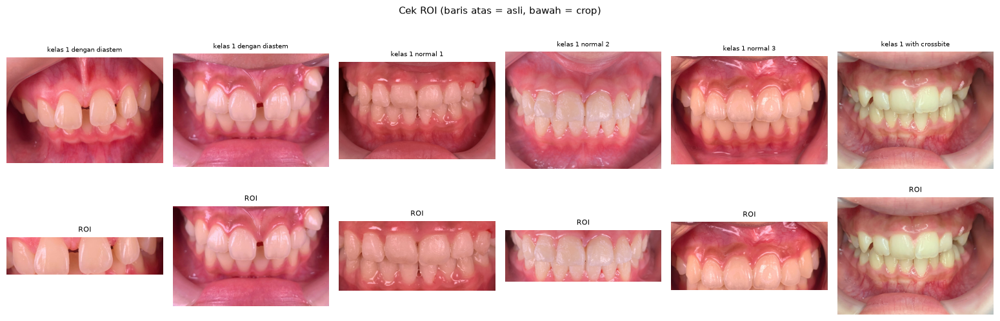

In [3]:
def teeth_roi_box(rgb01, s_thr=None, v_thr=None, dens=0.12, pad=None):
    """Heuristik HSV: gigi = saturasi rendah + brightness tinggi."""
    s_thr = CONFIG["roi_s_thr"] if s_thr is None else s_thr
    v_thr = CONFIG["roi_v_thr"] if v_thr is None else v_thr
    pad   = CONFIG["roi_pad"]   if pad   is None else pad
    mx = rgb01.max(-1); mn = rgb01.min(-1)
    v = mx; s = np.where(mx > 1e-6, (mx - mn) / (mx + 1e-6), 0.0)
    teeth = (s < s_thr) & (v > v_thr)
    H, W = teeth.shape
    col, row = teeth.mean(0), teeth.mean(1)
    def center_box(fw=0.8, fh=0.6):
        cw, ch = int(W*fw), int(H*fh); x0=(W-cw)//2; y0=(H-ch)//2
        return (x0, y0, x0+cw, y0+ch)
    if col.max() < 1e-3 or row.max() < 1e-3:
        return center_box()
    cx = np.where(col > dens*col.max())[0]; ry = np.where(row > dens*row.max())[0]
    x0, x1, y0, y1 = int(cx.min()), int(cx.max()), int(ry.min()), int(ry.max())
    bw, bh = x1-x0, y1-y0
    if bw < 0.25*W or bh < 0.15*H:
        return center_box()
    pw, ph = int(bw*pad), int(bh*pad)
    return (max(0,x0-pw), max(0,y0-ph), min(W,x1+pw), min(H,y1+ph))


def load_rgb(path, max_side=1024):
    """Baca gambar -> PIL RGB, dikecilkan agar inferensi wajar cepat."""
    im = Image.open(path).convert("RGB")
    if max(im.size) > max_side:
        sc = max_side / max(im.size)
        im = im.resize((int(im.width*sc), int(im.height*sc)), Image.LANCZOS)
    return im


def roi_pil(path):
    im = load_rgb(path)
    if not CONFIG["use_roi"]:
        return im
    box = teeth_roi_box(np.asarray(im, np.float32) / 255.)
    return im.crop(box)

# sanity check ROI di 6 foto pertama
k = min(6, len(paths))
fig, ax = plt.subplots(2, k, figsize=(2.6*k, 5.4))
for i in range(k):
    ax[0, i].imshow(load_rgb(paths[i])); ax[0, i].axis("off")
    ax[0, i].set_title(names[i][:22], fontsize=7)
    ax[1, i].imshow(roi_pil(paths[i]));  ax[1, i].axis("off")
    ax[1, i].set_title("ROI", fontsize=8)
plt.suptitle("Cek ROI (baris atas = asli, bawah = crop)", fontsize=11)
plt.tight_layout(); plt.show()

In [4]:
import torch, torchvision
print(torch.__version__, torchvision.__version__, torch.backends.mps.is_available())

2.8.0 0.23.0 True


## 3. Muat Depth Anything V2 (ViT-L) & fungsi inferensi

In [5]:
from transformers import AutoImageProcessor, AutoModelForDepthEstimation

# Workaround: unload torchaudio if it causes symbol conflicts on macOS
try:
    import sys
    if 'torchaudio' in sys.modules:
        del sys.modules['torchaudio']
except:
    pass

MODEL_ID = CONFIG["model_id"]
processor = AutoImageProcessor.from_pretrained(MODEL_ID)
model = AutoModelForDepthEstimation.from_pretrained(MODEL_ID).to(DEVICE).eval()

n_par = sum(p.numel() for p in model.parameters()) / 1e6
print(f"Loaded: {MODEL_ID}  ({n_par:.0f}M params) on {DEVICE}")


@torch.no_grad()
def predict_depth(pil_img):
    """
    -> depth float32 (H, W) pada resolusi asli pil_img.

    PENTING: nilainya adalah *relative inverse depth*. Besar = DEKAT ke kamera.
    Skala & offset tidak diketahui dan berbeda antar gambar -> jangan pernah
    bandingkan nilai absolut antar foto.
    """
    inputs = processor(images=pil_img, return_tensors="pt").to(DEVICE)
    out = model(**inputs).predicted_depth          # (1, h, w)
    d = F.interpolate(out.unsqueeze(1), size=pil_img.size[::-1],
                      mode="bicubic", align_corners=False)[0, 0]
    return d.detach().float().cpu().numpy()


def norm01(d):
    """Normalisasi min-max per gambar — HANYA untuk visualisasi."""
    lo, hi = np.percentile(d, 1), np.percentile(d, 99)
    return np.clip((d - lo) / (hi - lo + 1e-8), 0, 1)

model.safetensors: reconstructing file:   0%|          |  0.00B / 1.34GB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/503 [00:00<?, ?it/s]

Loaded: depth-anything/Depth-Anything-V2-Large-hf  (335M params) on mps


## 4. Inferensi seluruh dataset

Disimpan ke `depth_out/`: PNG berwarna untuk dilihat mata, dan `.npy` float32 untuk analisis.

In [6]:
import time

results = {}     # name -> dict(rgb, depth, ...)
t0 = time.time()

for p, n in zip(paths, names):
    im  = roi_pil(p)
    rgb = np.asarray(im, np.float32) / 255.
    d   = predict_depth(im)
    results[n] = {"path": p, "rgb": rgb, "depth": d}

    if CONFIG["save_npy"]:
        np.save(os.path.join(CONFIG["out_dir"], f"{n}.npy"), d.astype(np.float32))
    plt.imsave(os.path.join(CONFIG["out_dir"], f"{n}_depth.png"), norm01(d), cmap="inferno")

    print(f"  {n[:45]:45s} shape={d.shape}  range=[{d.min():.2f}, {d.max():.2f}]")

print(f"\nSelesai {len(results)} foto dalam {time.time()-t0:.1f}s "
      f"({(time.time()-t0)/len(results):.1f}s/foto). Hasil -> {CONFIG['out_dir']}/")

  kelas 1 dengan diastema 1                     shape=(194, 806)  range=[94.03, 261.70]
  kelas 1 dengan diastema 2                     shape=(654, 1024)  range=[28.51, 473.29]
  kelas 1 normal 1                              shape=(365, 818)  range=[50.98, 325.53]
  kelas 1 normal 2                              shape=(336, 1015)  range=[50.68, 302.42]
  kelas 1 normal 3                              shape=(431, 993)  range=[33.74, 451.67]
  kelas 1 with crossbite and crowding 1         shape=(768, 1024)  range=[28.30, 450.54]
  kelas 1 with crowding lower anterior 1        shape=(691, 982)  range=[22.25, 329.92]
  kelas 1 with crowding lower anterior 2        shape=(551, 968)  range=[4.30, 352.85]
  kelas 1 with crowding, midline shifting, cros shape=(895, 1024)  range=[15.77, 372.27]
  kelas 1 with crowding, midline shifting, cros shape=(435, 1002)  range=[37.84, 376.18]
  kelas 1 with deep bite and protrusion 1       shape=(476, 932)  range=[24.91, 350.53]
  kelas 1 with deep bite and

## 5. Panel visual — RGB | depth | overlay | kontur

**Cara membacanya (ini bagian terpenting dari notebook):**

- Warna **terang (kuning)** = lebih dekat ke kamera, **gelap (ungu)** = lebih jauh.
- Yang kita **harap** lihat: gigi anterior lebih terang daripada gigi posterior/molar,
  batas antar gigi terlihat, dan gigi yang labioversi menonjol terang dibanding tetangganya.
- Yang **menandakan gagal**: peta depth hanya mengikuti pola kecerahan foto (area kena flash
  jadi "dekat"), atau seluruh rongga mulut jadi satu gumpalan datar tanpa struktur gigi.

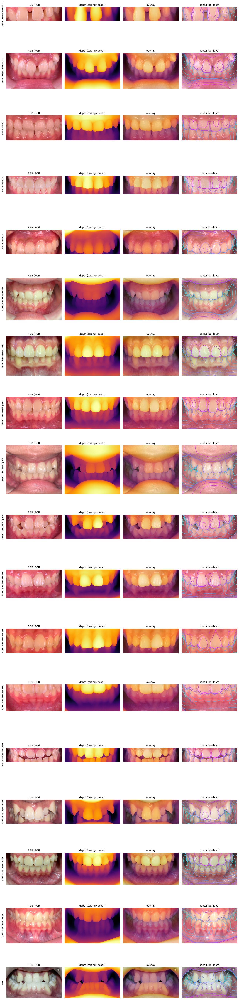

In [7]:
N = len(results)
fig, axes = plt.subplots(N, 4, figsize=(13, 3.1*N))
if N == 1: axes = axes[None, :]

for i, (n, r) in enumerate(results.items()):
    rgb, d = r["rgb"], r["depth"]
    dn = norm01(d)

    axes[i,0].imshow(rgb);              axes[i,0].set_title("RGB (ROI)", fontsize=9)
    axes[i,1].imshow(dn, cmap="inferno");axes[i,1].set_title("depth (terang=dekat)", fontsize=9)
    axes[i,2].imshow(rgb); axes[i,2].imshow(dn, cmap="inferno", alpha=0.5)
    axes[i,2].set_title("overlay", fontsize=9)
    axes[i,3].imshow(rgb, alpha=0.85)
    axes[i,3].contour(dn, levels=10, cmap="cool", linewidths=0.8)
    axes[i,3].set_title("kontur iso-depth", fontsize=9)

    for a in axes[i]: a.axis("off")
    axes[i,0].set_ylabel(n[:20], fontsize=7)
    axes[i,0].text(-0.04, 0.5, n[:26], transform=axes[i,0].transAxes,
                   rotation=90, va="center", ha="right", fontsize=7)

plt.tight_layout(); plt.show()

## 6. PROBE 1 — apakah depth cuma menyalin kecerahan?

Ini **uji pembunuh** utama. Model monocular depth sangat mengandalkan *shading*. Pada foto
intraoral dengan flash langsung, permukaan yang menghadap kamera otomatis paling terang —
sehingga model bisa saja hanya memetakan "terang → dekat" tanpa memahami geometri gigi sama sekali.

Kita ukur **korelasi Pearson & Spearman antara luminance dan depth** di dalam ROI:

| |r| | Tafsir |
|---|---|
| **> 0.85** | depth ≈ salinan kecerahan. **Tidak ada informasi baru.** Hentikan. |
| 0.6 – 0.85 | banyak dipengaruhi shading, tapi mungkin ada sisa sinyal geometri. Meragukan. |
| **< 0.6** | depth membawa struktur yang tidak ada di kecerahan. Layak dilanjutkan. |

Sekaligus dilaporkan **fraksi piksel spekular** (pantulan flash pada enamel basah), karena area
inilah yang paling sering menghasilkan depth palsu.

In [8]:
from scipy.stats import pearsonr, spearmanr
import pandas as pd

rows = []
for n, r in results.items():
    rgb, d = r["rgb"], r["depth"]
    lum  = rgb.mean(-1)                      # proxy luminance
    spec = (rgb.max(-1) > CONFIG["spec_thr"])
    valid = ~spec                            # exclude spekular dari korelasi

    x, y = lum[valid].ravel(), d[valid].ravel()
    sub = np.random.default_rng(0).choice(len(x), size=min(20000, len(x)), replace=False)
    pr = pearsonr(x[sub], y[sub])[0]
    sr = spearmanr(x[sub], y[sub])[0]

    rows.append({
        "foto": n[:38],
        "pearson_lum_depth":  round(float(pr), 3),
        "spearman_lum_depth": round(float(sr), 3),
        "spekular_%":         round(100*spec.mean(), 1),
        "depth_std_ternorm":  round(float(norm01(d).std()), 3),
    })

df = pd.DataFrame(rows).sort_values("pearson_lum_depth", key=abs, ascending=False)
df.to_csv(os.path.join(CONFIG["out_dir"], "probe1_luminance_vs_depth.csv"), index=False)

m = df["pearson_lum_depth"].abs().mean()
print(df.to_string(index=False))
print(f"\n|r| rata-rata = {m:.3f}")
print("VERDIKT:", "GAGAL — depth ~= kecerahan, tidak ada info baru" if m > 0.85
      else ("MERAGUKAN — sangat dipengaruhi shading" if m > 0.6
            else "LOLOS — depth membawa struktur di luar kecerahan"))

                                  foto  pearson_lum_depth  spearman_lum_depth  spekular_%  depth_std_ternorm
             kelas 1 dengan diastema 1              0.836               0.886        43.6              0.291
kelas 1 with upper anterior croeding a              0.765               0.781         0.4              0.269
                      kelas 1 normal 2              0.711               0.596        10.5              0.332
kelas 1 with deep bite and protrusion               0.711               0.667        34.4              0.271
kelas 1 with crowding lower anterior 2              0.706               0.699        30.0              0.269
kelas 1 with crowding, midline shiftin              0.659               0.715        16.6              0.283
kelas 1 with deep bite and protrusion               0.622               0.597        24.2              0.301
kelas 1 with multiple diastema and ope              0.614               0.551        29.6              0.292
             kelas 

## 7. PROBE 2 — profil kedalaman sepanjang lengkung gigi

Satu garis pindai horizontal melintasi gigi anterior. Kalau depth memang menangkap geometri,
profilnya akan **bergelombang mengikuti lengkung** (dental arch): gigi tengah lebih dekat,
menurun ke arah kaninus/premolar. Untuk kasus **labioversi/protrusi**, akan tampak **puncak lokal**
tepat di gigi yang menonjol.

Kalau profilnya datar atau bergerigi acak → depth tidak berguna untuk membedakan
labioversi vs palatoversi.

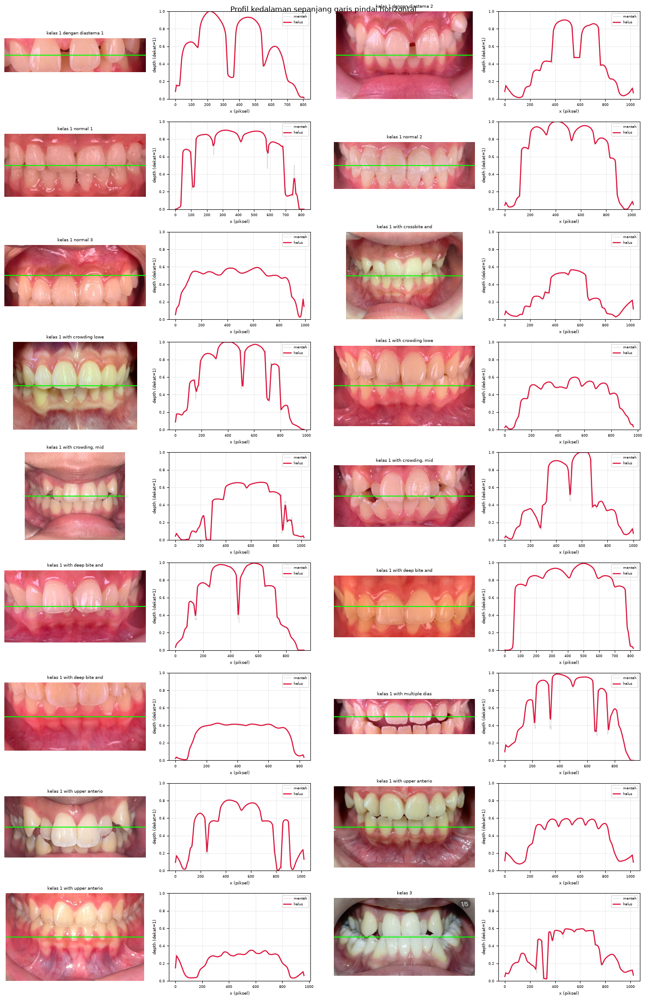

In [9]:
N = len(results)
ncol = 2
nrow = int(np.ceil(N / ncol))
fig, axes = plt.subplots(nrow, ncol*2, figsize=(15, 2.6*nrow))
axes = np.atleast_2d(axes)

for i, (n, r) in enumerate(results.items()):
    rr, cc = divmod(i, ncol)
    a_img, a_prof = axes[rr, cc*2], axes[rr, cc*2+1]
    rgb, d = r["rgb"], r["depth"]
    H, W = d.shape
    y = int(H * CONFIG["profile_frac"])

    prof = norm01(d)[y, :]
    prof_s = np.convolve(prof, np.ones(max(3, W//60))/max(3, W//60), mode="same")

    a_img.imshow(rgb); a_img.axhline(y, color="lime", lw=1.5); a_img.axis("off")
    a_img.set_title(n[:26], fontsize=7)

    a_prof.plot(prof, lw=0.6, alpha=0.4, color="gray", label="mentah")
    a_prof.plot(prof_s, lw=1.8, color="crimson", label="halus")
    a_prof.set_ylim(0, 1); a_prof.set_xlabel("x (piksel)", fontsize=7)
    a_prof.set_ylabel("depth (dekat=1)", fontsize=7)
    a_prof.tick_params(labelsize=6); a_prof.legend(fontsize=6)
    a_prof.grid(alpha=0.25)

for j in range(N, nrow*ncol):
    rr, cc = divmod(j, ncol)
    axes[rr, cc*2].axis("off"); axes[rr, cc*2+1].axis("off")

plt.suptitle("Profil kedalaman sepanjang garis pindai horizontal", fontsize=12)
plt.tight_layout(); plt.show()

## 8. PROBE 3 — uji weak-label dari nama file

Nama file di set drg Laura mengandung label lemah (`protrusion`, `crowding`, `crossbite`,
`normal`, `diastema`). Kalau depth membawa sinyal klinis, ukuran **kekasaran permukaan depth**
(std / rentang antar-kuartil di dalam ROI) mestinya **lebih tinggi** pada kasus crowding &
protrusion dibanding kasus normal.

n sangat kecil (18 foto, beberapa kelompok cuma 2-3 foto) — ini **indikasi arah**, bukan uji
statistik. Jangan mengambil kesimpulan kuat dari sini.

              depth_std           IQR       kekasaran      
                   mean count    mean count      mean count
label                                                      
crossbite        0.2760     3  0.4447     3    0.0029     3
crowding         0.2619     8  0.4255     8    0.0030     8
deep bite        0.2883     3  0.4353     3    0.0034     3
diastema         0.2977     3  0.5413     3    0.0042     3
lain             0.2500     1  0.2960     1    0.0038     1
midline shift    0.2674     5  0.4420     5    0.0032     5
normal           0.2730     3  0.4257     3    0.0033     3
open bite        0.2920     1  0.5300     1    0.0046     1
protrusion       0.2883     3  0.4353     3    0.0034     3


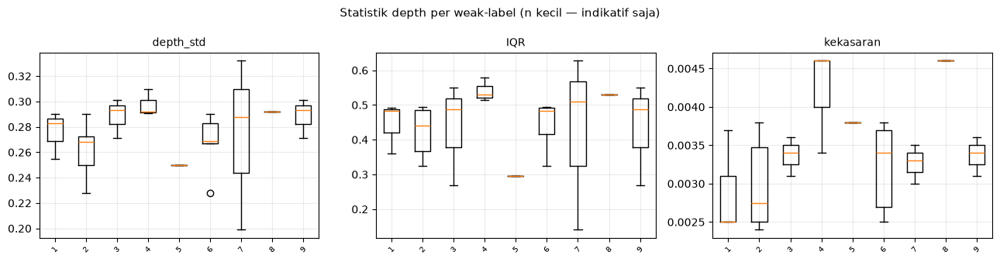

In [11]:
# catatan: 3 nama file mengandung salah ketik "croeding" -> dipetakan ke "crowding"
ALIAS = {
    "normal": ["normal"],
    "diastema": ["diastema"],
    "crowding": ["crowding", "croeding"],
    "crossbite": ["crossbite"],
    "protrusion": ["protrusion"],
    "open bite": ["open bite"],
    "deep bite": ["deep bite"],
    "midline shift": ["midline shift"],
}

def weak_labels(name):
    ln = name.lower()
    return [k for k, alts in ALIAS.items() if any(a in ln for a in alts)] or ["lain"]

rows = []
for n, r in results.items():
    dn = norm01(r["depth"])
    q75, q25 = np.percentile(dn, [75, 25])
    # kekasaran lokal: rata-rata magnitudo gradien (proxy iregularitas permukaan)
    gy, gx = np.gradient(dn)
    rough = float(np.mean(np.hypot(gx, gy)))
    for lab in weak_labels(n):
        rows.append({"label": lab, "foto": n[:34], "depth_std": round(float(dn.std()),3),
                     "IQR": round(float(q75-q25),3), "kekasaran": round(rough, 4)})

dfl = pd.DataFrame(rows)
agg = (dfl.groupby("label")[["depth_std","IQR","kekasaran"]]
          .agg(["mean","count"]).round(4))
print(agg.to_string())
dfl.to_csv(os.path.join(CONFIG["out_dir"], "probe3_weak_labels.csv"), index=False)

fig, ax = plt.subplots(1, 3, figsize=(13, 3.4))
for k, metric in enumerate(["depth_std", "IQR", "kekasaran"]):
    labs = sorted(dfl["label"].unique())
    data = [dfl[dfl.label == l][metric].values for l in labs]
    ax[k].boxplot(data, label=labs)
    ax[k].set_title(metric, fontsize=10)
    ax[k].tick_params(axis="x", rotation=45, labelsize=7)
    ax[k].grid(alpha=0.25)
plt.suptitle("Statistik depth per weak-label (n kecil — indikatif saja)", fontsize=11)
plt.tight_layout(); plt.show()

## 9. PROBE 4 — stabilitas terhadap flip horizontal

Uji konsistensi murah tapi tajam. Prediksi depth pada gambar asli, lalu pada gambar yang di-flip
horizontal, lalu flip balik hasilnya. Kalau modelnya benar-benar "membaca geometri", kedua peta
harus hampir identik. Ketidakstabilan tinggi = prediksi digerakkan oleh cue kontekstual yang
rapuh, bukan bentuk objek.

In [12]:
rows = []
for n, r in results.items():
    im = Image.fromarray((r["rgb"]*255).astype(np.uint8))
    d1 = norm01(r["depth"])
    d2 = norm01(predict_depth(im.transpose(Image.FLIP_LEFT_RIGHT)))[:, ::-1]
    mae  = float(np.abs(d1 - d2).mean())
    corr = float(pearsonr(d1.ravel(), d2.ravel())[0])
    rows.append({"foto": n[:38], "MAE_flip": round(mae,4), "corr_flip": round(corr,4)})

dff = pd.DataFrame(rows).sort_values("corr_flip")
dff.to_csv(os.path.join(CONFIG["out_dir"], "probe4_flip_stability.csv"), index=False)
print(dff.to_string(index=False))
mc = dff["corr_flip"].mean()
print(f"\nkorelasi flip rata-rata = {mc:.3f}")
print("VERDIKT:", "STABIL" if mc > 0.9 else ("SEDANG" if mc > 0.75 else "TIDAK STABIL — prediksi rapuh"))

                                  foto  MAE_flip  corr_flip
kelas 1 with multiple diastema and ope    0.0330     0.9876
             kelas 1 dengan diastema 1    0.0304     0.9903
kelas 1 with upper anterior croeding a    0.0255     0.9916
kelas 1 with crowding lower anterior 1    0.0256     0.9931
             kelas 1 dengan diastema 2    0.0256     0.9934
kelas 1 with deep bite and protrusion     0.0247     0.9937
kelas 1 with upper anterior croeding a    0.0197     0.9955
                      kelas 1 normal 2    0.0262     0.9960
kelas 1 with crowding, midline shiftin    0.0202     0.9964
                      kelas 1 normal 3    0.0114     0.9977
kelas 1 with crowding lower anterior 2    0.0151     0.9978
kelas 1 with upper anterior croeding a    0.0120     0.9978
kelas 1 with deep bite and protrusion     0.0142     0.9986
                               kelas 3    0.0107     0.9987
kelas 1 with crowding, midline shiftin    0.0110     0.9988
kelas 1 with deep bite and protrusion   

## 10. Ringkasan keputusan

Isi sendiri setelah melihat hasil. Aturan mainnya:

| Probe | Ambang lolos | Kalau gagal |
|---|---|---|
| P1 luminance vs depth | \|r\| < 0.6 | depth = salinan shading → **hentikan, jangan pakai depth** |
| P2 profil arch | terlihat gelombang mengikuti lengkung | tidak ada geometri arch yang tertangkap |
| P3 weak-label | crowding/protrusion > normal | tidak ada sinyal klinis |
| P4 stabilitas flip | corr > 0.9 | prediksi rapuh, tidak bisa dipercaya |

**Lolos P1 + P4 adalah syarat minimum.** P2 dan P3 menentukan apakah depth layak jadi fitur, bukan
sekadar tidak berbahaya.

In [13]:
summary = {
    "model": MODEL_ID, "device": str(DEVICE), "n_foto": len(results),
    "P1_mean_abs_pearson_lum_depth": float(df["pearson_lum_depth"].abs().mean()),
    "P1_mean_spekular_pct":          float(df["spekular_%"].mean()),
    "P4_mean_corr_flip":             float(dff["corr_flip"].mean()),
    "P4_mean_mae_flip":              float(dff["MAE_flip"].mean()),
}
with open(os.path.join(CONFIG["out_dir"], "summary.json"), "w") as f:
    json.dump(summary, f, indent=2)

print(json.dumps(summary, indent=2))
print()
p1_ok = summary["P1_mean_abs_pearson_lum_depth"] < 0.6
p4_ok = summary["P4_mean_corr_flip"] > 0.9
print("P1 (bukan salinan kecerahan):", "LOLOS" if p1_ok else "GAGAL")
print("P4 (stabil terhadap flip)   :", "LOLOS" if p4_ok else "GAGAL")
print("\n=> KESIMPULAN:", "Layak lanjut ke eksperimen fitur depth."
      if (p1_ok and p4_ok) else
      "TIDAK layak. Depth Anything tidak membawa geometri gigi yang bisa dipercaya "
      "pada foto ini — jangan investasi lebih jauh.")

{
  "model": "depth-anything/Depth-Anything-V2-Large-hf",
  "device": "mps",
  "n_foto": 18,
  "P1_mean_abs_pearson_lum_depth": 0.5489444444444445,
  "P1_mean_spekular_pct": 19.211111111111112,
  "P4_mean_corr_flip": 0.9957722222222221,
  "P4_mean_mae_flip": 0.01876111111111111
}

P1 (bukan salinan kecerahan): LOLOS
P4 (stabil terhadap flip)   : LOLOS

=> KESIMPULAN: Layak lanjut ke eksperimen fitur depth.


## 11. (Opsional) Fitur depth untuk pipeline AC — **hanya jalankan kalau P1 & P4 lolos**

Sel di bawah membuat vektor fitur depth ringkas per foto (8 angka) yang bisa **digabungkan**
dengan embedding DINOv2 di notebook similarity. Ini **bukan** pengukuran milimeter — semuanya
besaran relatif tanpa satuan.

Cara memakainya nanti: `np.concatenate([dino_emb_ternormalisasi, w * depth_feat_ternormalisasi])`,
lalu cosine similarity seperti biasa. Bobot `w` disetel lewat sweep (notebook `teeth_similarity_sweep`).

**Peringatan penting:** 10 anchor AC adalah *foto hasil pindai buku referensi*, bukan foto klinis.
Depth map pada anchor kemungkinan besar kacau. Periksa visualnya dulu sebelum menggabungkan fitur —
kalau anchor-nya rusak, seluruh perbandingan jadi tidak berarti.

In [14]:
def depth_features(d):
    """8 statistik bentuk dari depth map ternormalisasi (tanpa satuan)."""
    dn = norm01(d)
    gy, gx = np.gradient(dn)
    H, W = dn.shape
    cols = dn.mean(0)                                  # profil horizontal rata-rata
    return np.array([
        dn.std(),                                      # sebaran kedalaman
        np.percentile(dn, 75) - np.percentile(dn, 25), # IQR
        np.mean(np.hypot(gx, gy)),                     # kekasaran
        np.std(np.hypot(gx, gy)),
        cols.std(),                                    # variasi sepanjang lengkung
        float(np.argmax(cols)) / W,                    # posisi titik terdekat (proxy asimetri)
        dn[:, :W//2].mean() - dn[:, W//2:].mean(),     # asimetri kiri-kanan
        dn[:H//2].mean() - dn[H//2:].mean(),           # asimetri atas-bawah
    ], dtype=np.float32)

feat = {n: depth_features(r["depth"]) for n, r in results.items()}
Fm = np.stack([feat[n] for n in results])
np.save(os.path.join(CONFIG["out_dir"], "depth_features.npy"), Fm)

cols = ["std","IQR","rough_mean","rough_std","col_std","argmax_x","asim_LR","asim_TB"]
print(pd.DataFrame(Fm, index=[n[:34] for n in results], columns=cols).round(3).to_string())
print("\nDisimpan -> depth_out/depth_features.npy", Fm.shape)

                                      std    IQR  rough_mean  rough_std  col_std  argmax_x  asim_LR  asim_TB
kelas 1 dengan diastema 1           0.291  0.514       0.005      0.010    0.282     0.270    0.160    0.065
kelas 1 dengan diastema 2           0.310  0.580       0.003      0.009    0.166     0.457   -0.055    0.104
kelas 1 normal 1                    0.288  0.509       0.003      0.015    0.142     0.440    0.047    0.434
kelas 1 normal 2                    0.332  0.627       0.003      0.009    0.284     0.433    0.070    0.230
kelas 1 normal 3                    0.199  0.141       0.003      0.009    0.111     0.422    0.068    0.123
kelas 1 with crossbite and crowdin  0.255  0.360       0.003      0.008    0.092     0.426    0.029    0.142
kelas 1 with crowding lower anteri  0.234  0.368       0.002      0.010    0.128     0.429    0.077    0.290
kelas 1 with crowding lower anteri  0.269  0.466       0.003      0.010    0.157     0.549   -0.028    0.315
kelas 1 with crowdi